In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly_express as px
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = pd.read_csv('/Users/zhangtiantian/Documents/7360/visualization/final.csv')

In [23]:
print(type(data))
data.head(5)

<class 'pandas.core.frame.DataFrame'>


,Date,District,Time,CO,FSP,NO2,NOX,O3,RSP,SO2,AQHI,lat,lon
0,2020/1/1,Causeway Bay,9,89.0,3.0,68.0,198.0,19.0,49.0,6.0,3,22.281672,114.183565
1,2020/1/1,Causeway Bay,24,63.0,2.0,45.0,74.0,64.0,3.0,4.0,4,22.281672,114.183565
2,2020/1/2,Causeway Bay,9,79.0,2.0,88.0,2.0,15.0,51.0,7.0,4,22.281672,114.183565
3,2020/1/2,Causeway Bay,24,92.0,43.0,77.0,2.0,7.0,66.0,8.0,4,22.281672,114.183565
4,2020/1/3,Causeway Bay,9,94.0,3.0,155.0,487.0,9.0,52.0,11.0,4,22.281672,114.183565


In [24]:
hkap1 = data[['CO','FSP','NO2','NOX','O3','RSP','SO2','AQHI']]

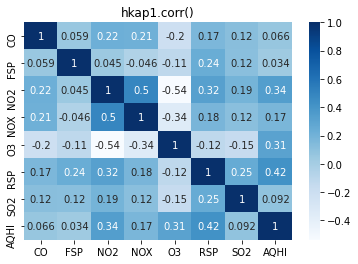

In [25]:
hkap1.corr()
sns.heatmap(hkap1.corr(), annot=True, cmap='Blues') #headmap构建热点图
plt.title('hkap1.corr()');

In [26]:
hkap_9 = data[data['Time'] == 9].groupby(by='District')['AQHI'].mean()
hkap_9

District
Causeway Bay    3.483871
Central         3.612903
Mong Kok        3.322581
Tap Mun         2.903226
Tseung Kwan     3.161290
Tsuen Wan       2.903226
Tuen Mun        3.096774
Yuen Long       2.903226
Name: AQHI, dtype: float64

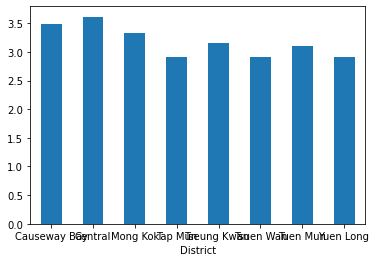

In [28]:
hkap_9.plot(kind='bar', rot=0)
plt.show()

In [29]:
hkap_24 = data[data['Time'] == 24].groupby(by='District')['AQHI'].mean()
hkap_24


District
Causeway Bay    4.032258
Central         4.064516
Mong Kok        3.870968
Tap Mun         3.387097
Tseung Kwan     3.612903
Tsuen Wan       3.258065
Tuen Mun        3.612903
Yuen Long       3.354839
Name: AQHI, dtype: float64

In [30]:
print(type(hkap_24))
hkap_24.head(5)

<class 'pandas.core.series.Series'>


District
Causeway Bay    4.032258
Central         4.064516
Mong Kok        3.870968
Tap Mun         3.387097
Tseung Kwan     3.612903
Name: AQHI, dtype: float64

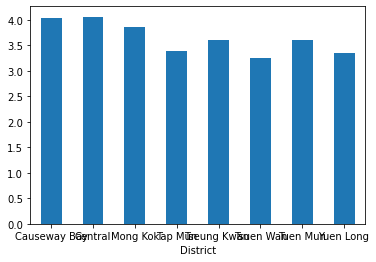

In [31]:
hkap_24.plot(kind='bar', rot=0)
plt.show()

In [32]:
!pip install cufflinks --upgrade

In [33]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [34]:
hkap_24[['CO','FSP','NO2','NOX','O3','RSP','SO2','AQHI']].iplot(kind = 'spread')

KeyError: "None of [Index(['CO', 'FSP', 'NO2', 'NOX', 'O3', 'RSP', 'SO2', 'AQHI'], dtype='object', name='District')] are in the [index]"

In [35]:
data2 = data[data['Time']==9]

In [36]:
data3 = data2[data2['District']== 'Causeway Bay']

In [37]:
px.scatter(data2, x='NOX', y='AQHI',color='District',hover_name='Date',facet_col='District',log_x=True)

In [38]:
px.scatter(data2, x='O3', y='AQHI',color='District',hover_name='Date',facet_col='District',log_x=True)

In [39]:
px.scatter(data2, x='RSP', y='AQHI',color='District',hover_name='Date',facet_col='District',log_x=True)

/Library/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='AQHI', ylabel='Density'>

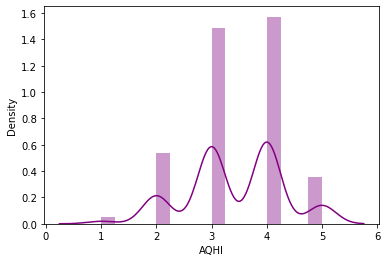

In [40]:
sns.distplot(data["AQHI"], bins=16, color="purple")
# Binsize is calculated using square-root of row count.

In [41]:
data123 = pd.read_csv('/Users/zhangtiantian/Documents/7360/visualization/datachart/finaldata.csv')

In [42]:
token='pk.eyJ1IjoiZnVsbGx5eXkiLCJhIjoiY2t3azVkYmxzMDM1eTJydGIzdjN5a296dyJ9.bGzKw--AmwS7ufx_ORDkvg'

In [43]:
fig=px.scatter_mapbox(data123,
                      lon='lon',
                      lat='lat',
                      size='AQHI',
                      color='AQHI',
                      title='AQHI',
                      hover_name='District',
                      size_max=10,
                      color_continuous_scale=px.colors.carto.Temps
                      
                     )

fig.update_layout(mapbox={'accesstoken':token,'center':{'lon':114.2,'lat':22.323},'zoom':10,'style':'dark'},
                  title=dict(x=0.5, xref='paper'),
                  margin = {'l':0,'r':0,'t':0,'b':0})

In [44]:
fig=px.scatter_mapbox(data123,
                      lon='lon',
                      lat='lat',
                      size='NOX',
                      color='NOX',
                      title='NOX',
                      hover_name='District',
                      size_max=30,
                      color_continuous_scale=px.colors.carto.Temps
                      
                     )

fig.update_layout(mapbox={'accesstoken':token,'center':{'lon':114.2,'lat':22.323},'zoom':10,'style':'dark'},
                  title=dict(x=0.5, xref='paper'),
                  margin = {'l':0,'r':0,'t':0,'b':0})

In [45]:
!pip install cufflinks --upgrade

In [46]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [47]:
pollutant = pd.read_csv('/Users/zhangtiantian/Documents/7360/visualization/datachart/pollutant.csv')

In [48]:
pollutant[['CO','FSP','NO2','NOX','O3','RSP','SO2']].iplot(kind = 'spread')#Pollutant emissions at 9am

/Library/anaconda3/lib/python3.8/site-packages/cufflinks/plotlytools.py:849: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead

/Library/anaconda3/lib/python3.8/site-packages/cufflinks/plotlytools.py:850: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [79]:
aq = pd.read_csv('/Users/zhangtiantian/Documents/7360/visualization/final.csv')

In [80]:
maq = aq[aq['Time']==9]
maq

,Date,District,Time,CO,FSP,NO2,NOX,O3,RSP,SO2,AQHI,lat,lon
0,2020/1/1,Causeway Bay,9,89.0,3.0,68.0,198.0,19.0,49.0,6.0,3,22.281672,114.183565
2,2020/1/2,Causeway Bay,9,79.0,2.0,88.0,2.0,15.0,51.0,7.0,4,22.281672,114.183565
4,2020/1/3,Causeway Bay,9,94.0,3.0,155.0,487.0,9.0,52.0,11.0,4,22.281672,114.183565
6,2020/1/4,Causeway Bay,9,76.0,2.0,87.0,2.0,2.0,42.0,7.0,4,22.281672,114.183565
8,2020/1/5,Causeway Bay,9,61.0,2.0,54.0,115.0,3.0,3.0,5.0,3,22.281672,114.183565
...,...,...,...,...,...,...,...,...,...,...,...,...,...
486,2020/1/27,Yuen Long,9,69.0,3.0,15.0,2.0,3.0,8.0,5.0,2,22.446921,114.026570
488,2020/1/28,Yuen Long,9,47.0,6.0,2.0,3.0,3.0,11.0,5.0,2,22.446921,114.026570
490,2020/1/29,Yuen Long,9,59.0,15.0,2.0,3.0,49.0,2.0,5.0,3,22.446921,114.026570
492,2020/1/30,Yuen Long,9,48.0,2.0,2.0,3.0,63.0,3.0,6.0,3,22.446921,114.026570


In [86]:
naq = aq[aq['Time']==24]
naq

,Date,District,Time,CO,FSP,NO2,NOX,O3,RSP,SO2,AQHI,lat,lon
1,2020/1/1,Causeway Bay,24,63.0,2.0,45.0,74.0,64.0,3.0,4.0,4,22.281672,114.183565
3,2020/1/2,Causeway Bay,24,92.0,43.0,77.0,2.0,7.0,66.0,8.0,4,22.281672,114.183565
5,2020/1/3,Causeway Bay,24,68.0,41.0,66.0,118.0,46.0,56.0,6.0,4,22.281672,114.183565
7,2020/1/4,Causeway Bay,24,80.0,3.0,83.0,182.0,3.0,50.0,7.0,4,22.281672,114.183565
9,2020/1/5,Causeway Bay,24,57.0,19.0,41.0,66.0,65.0,3.0,6.0,4,22.281672,114.183565
...,...,...,...,...,...,...,...,...,...,...,...,...,...
487,2020/1/27,Yuen Long,24,54.0,7.0,17.0,2.0,3.0,9.0,5.0,2,22.446921,114.026570
489,2020/1/28,Yuen Long,24,60.0,14.0,19.0,2.0,48.0,16.0,5.0,3,22.446921,114.026570
491,2020/1/29,Yuen Long,24,56.0,17.0,3.0,3.0,46.0,2.0,5.0,3,22.446921,114.026570
493,2020/1/30,Yuen Long,24,61.0,NaN,57.0,77.0,3.0,2.0,6.0,3,22.446921,114.026570


In [84]:
maq[['AQHI']].iplot()#AQHI emissions at 9am

In [89]:
naq[['AQHI']].iplot()#AQHI emissions at 24pm

In [63]:
naq = pd.DataFrame(np.random.randn(1000, 7),
                  columns=['CO','FSP','NO2','NOX','O3','RSP','SO2'])
naq.scatter_matrix()#Values for various pollutants at 24pm


In [64]:
maq = pd.DataFrame(np.random.randn(1000, 7),
                  columns=['CO','FSP','NO2','NOX','O3','RSP','SO2'])
maq.scatter_matrix()#Values for various pollutants at 9am


In [75]:
naq=cf.datagen.lines(8)#Values for various pollutants at 24pm

naq.iplot(subplots=True,subplot_titles=['CO','FSP','NO2','NOX','O3','RSP','SO2','AQHI'],legend=True)

In [73]:
maq=cf.datagen.lines(8)#Values for various pollutants at 9am
maq.iplot(subplots=True,subplot_titles=['CO','FSP','NO2','NOX','O3','RSP','SO2','AQHI'],legend=True)